In [125]:
#Imported Package
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

In [126]:
def Image_Crop(image):
    height = int(len(image)/3) #image length divided by three. "height" is only the height of the a picture.
    width  = image.shape[1] # Assign image width 

    blue = image[0:height,:]            # This code divided the picture into 3 parts
    green = image[height:2*height,:]
    red = image[2*height:3*height,:] 
    
    print("\nCROPPING RESULTS:")
    print("- B: ", blue.shape)
    print("- G: ", green.shape)
    print("- R: ", red.shape)
    return blue, green, red

In [127]:
def NCC_Algorithm(color1,color2,distance):#color1 and color2 : parted image, distance : values

    best = -1 # Holds best align
    align = [0,0] # Assign zero
    for x in range(-distance,distance+1):# x range (-20, 21)
        for y in range(-distance,distance+1):# y range (-20, 21) 
            
            moved_color1= np.roll(color1,[x,y],axis=(0,1))# move image on the y-axis
            moved_color1 = moved_color1 - moved_color1.mean(axis=0)#Subtract the mean picture from the moving picture.
            
            NCC = np.sum( (moved_color1/np.linalg.norm(moved_color1)) * (color2/np.linalg.norm(color2)) )
            #calculate the inverse matrix of color1 and color2
            #the transaction is calculated and this sum assign to 'NCC';
            if NCC > best: 
                best = NCC
                align = [x,y]# get the new coordinates.
    
    print("Align :", align)
    print("Best NCC : ",best)
    return np.roll(color1,align,axis=(0,1))# returns the rolled of Resim1. 

In [128]:
def Final_Image(blue,green,red,distance):
    red_to_blue = NCC_Algorithm(red,blue,distance)# red align to blue picture
    green_to_blue = NCC_Algorithm(green,blue,distance)# green align to blue picture

    final_image = np.dstack((blue, green_to_blue, red_to_blue))# Three part are combined with dstack 
    return final_image#returns the combined picture

In [129]:
image_folder = 'C:/Users/SELCUK/Desktop/assignment_1/images/*.jpg'#Path 
image_paths = glob(image_folder)# Assigned the all paths 


CROPPING RESULTS:
- B:  (411, 480)
- G:  (411, 480)
- R:  (411, 480)
Align : [12, 4]
Best NCC :  0.3021041155947017
Align : [6, 2]
Best NCC :  0.32036678100148414


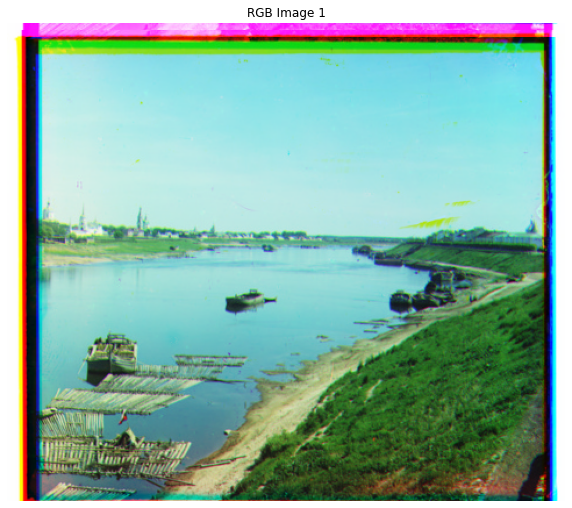

In [130]:
#First Image
image = cv2.imread(image_paths[0])#read a first picture
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)# convert to gray
blue, green, red = Image_Crop(gray)# Divided three parts and aligned 
final = Final_Image(blue,green,red,20)#Combined image, 20 = distance

plt.figure(figsize=(10, 10))#İmage size 
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))#Displaying RGB color digital image file (Matplotlib (BGR -> RGB))
plt.title('RGB Image 1')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (411, 480)
- G:  (411, 480)
- R:  (411, 480)
Align : [13, 7]
Best NCC :  0.23174633332502037
Align : [6, 5]
Best NCC :  0.20210268658717762


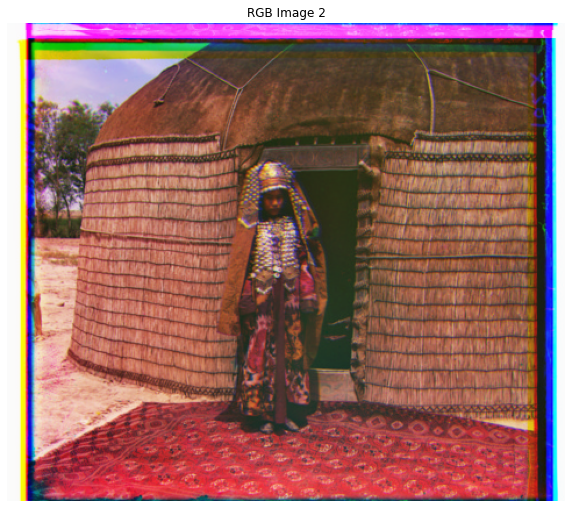

In [131]:
#Second Image
image = cv2.imread(image_paths[1])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 2')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 393)
- G:  (341, 393)
- R:  (341, 393)
Align : [4, 5]
Best NCC :  0.20918572093842755
Align : [-2, 2]
Best NCC :  0.20966317911199242


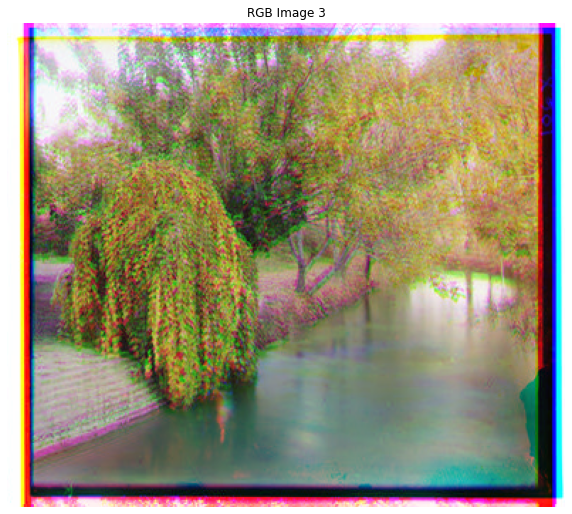

In [132]:
#Third Image
image = cv2.imread(image_paths[2])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 3')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 401)
- G:  (341, 401)
- R:  (341, 401)
Align : [9, -1]
Best NCC :  0.29315420274559234
Align : [4, 1]
Best NCC :  0.2872820225128106


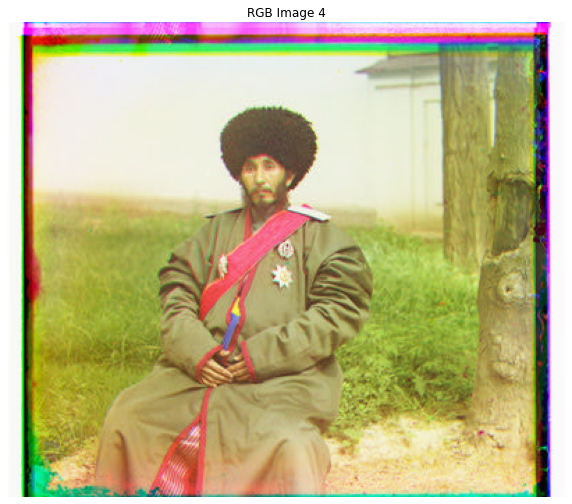

In [133]:
#Fourth Image
image = cv2.imread(image_paths[3])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 4')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (414, 480)
- G:  (414, 480)
- R:  (414, 480)
Align : [10, 5]
Best NCC :  0.2241454667470641
Align : [4, 3]
Best NCC :  0.26697510124501317


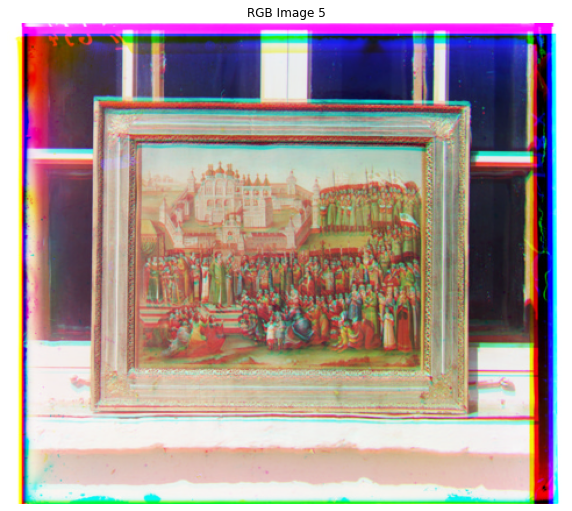

In [134]:
#Fifth Image
image = cv2.imread(image_paths[4])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 5')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 400)
- G:  (341, 400)
- R:  (341, 400)
Align : [10, 8]
Best NCC :  0.2335821305173773
Align : [6, 6]
Best NCC :  0.2639548301381188


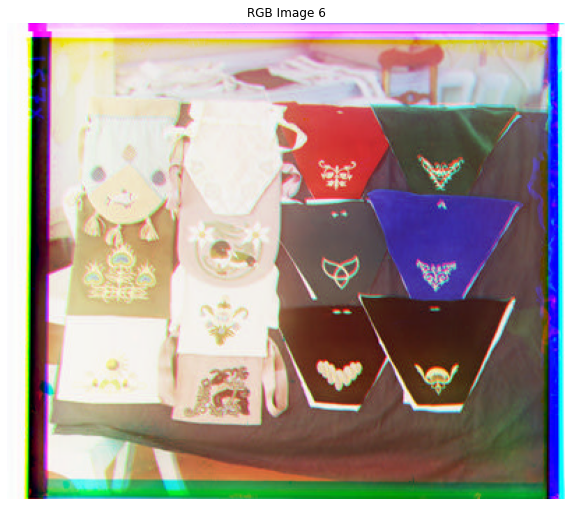

In [135]:
#Sixth Image
image = cv2.imread(image_paths[5])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 6')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 387)
- G:  (341, 387)
- R:  (341, 387)
Align : [3, 1]
Best NCC :  0.396241344880605
Align : [-2, 1]
Best NCC :  0.43935028600872766


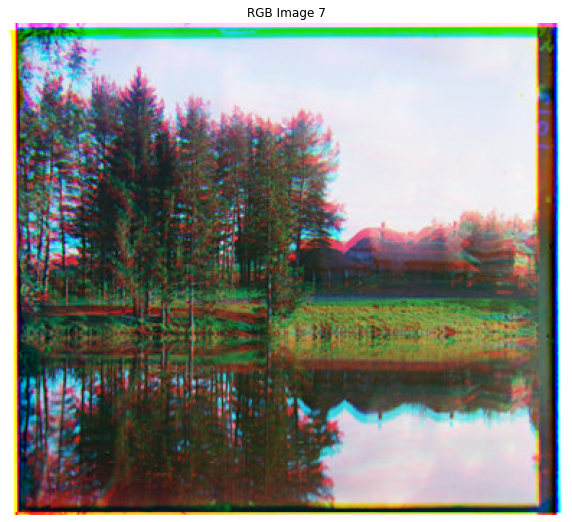

In [136]:
#Seventh Image
image = cv2.imread(image_paths[6])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 7')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 396)
- G:  (341, 396)
- R:  (341, 396)
Align : [13, 1]
Best NCC :  0.3022432409750373
Align : [4, 0]
Best NCC :  0.30214693529281017


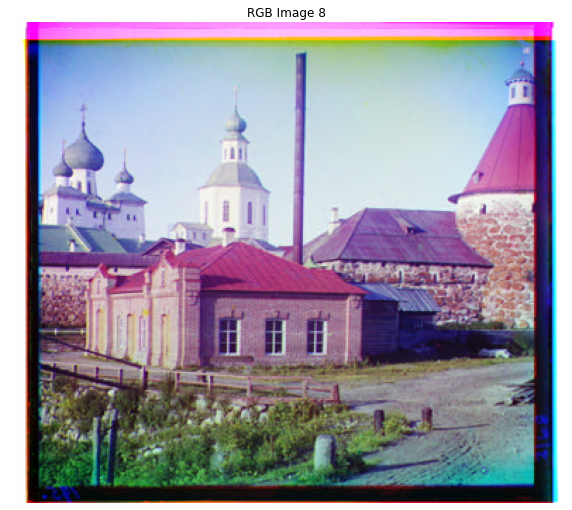

In [137]:
#Eigth Image
image = cv2.imread(image_paths[7])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 8')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (416, 480)
- G:  (416, 480)
- R:  (416, 480)
Align : [6, 2]
Best NCC :  0.35011271350274903
Align : [5, 0]
Best NCC :  0.3467875379589534


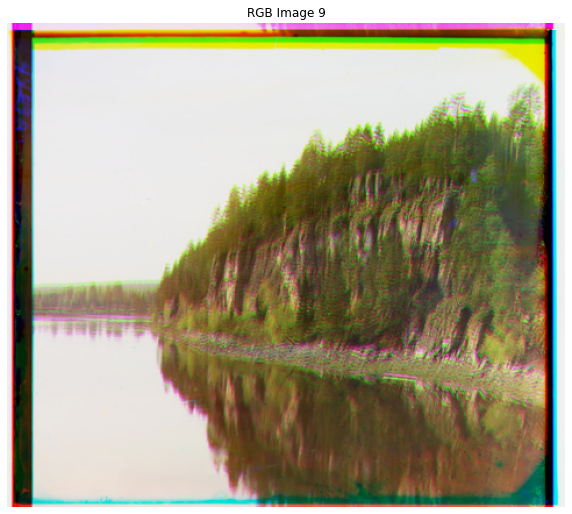

In [138]:
#Ninth Image
image = cv2.imread(image_paths[8])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 9')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 394)
- G:  (341, 394)
- R:  (341, 394)
Align : [5, 5]
Best NCC :  0.056495722494007375
Align : [2, 3]
Best NCC :  0.25813241612617677


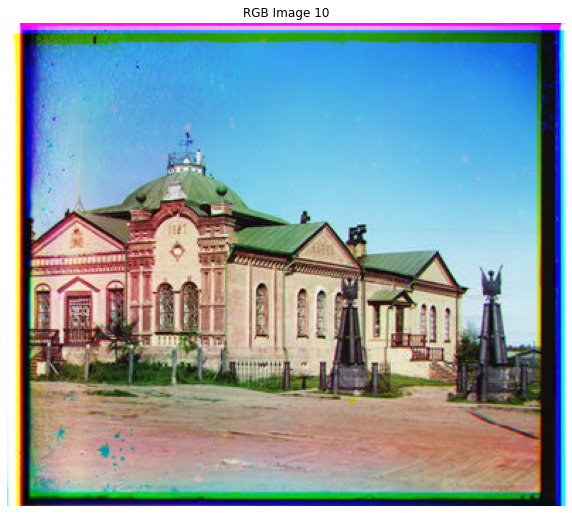

In [139]:
#Tenth Image
image = cv2.imread(image_paths[9])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 10')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (418, 480)
- G:  (418, 480)
- R:  (418, 480)
Align : [15, 4]
Best NCC :  0.30928346786571176
Align : [7, 3]
Best NCC :  0.3909172009312556


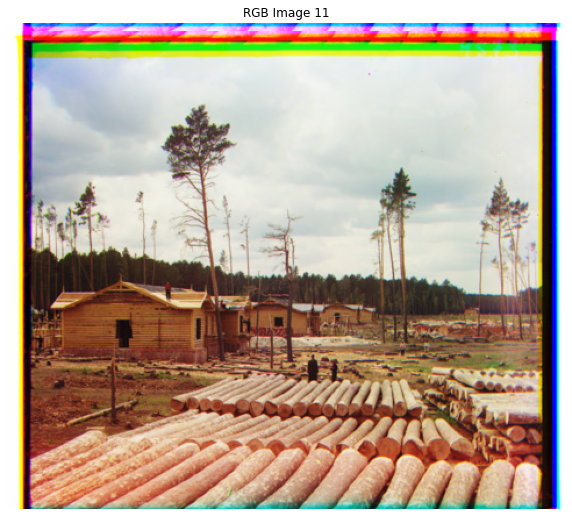

In [140]:
#Eleventh Image
image = cv2.imread(image_paths[10])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 11')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 392)
- G:  (341, 392)
- R:  (341, 392)
Align : [10, 0]
Best NCC :  0.20062100011972744
Align : [6, 1]
Best NCC :  0.22413695419791368


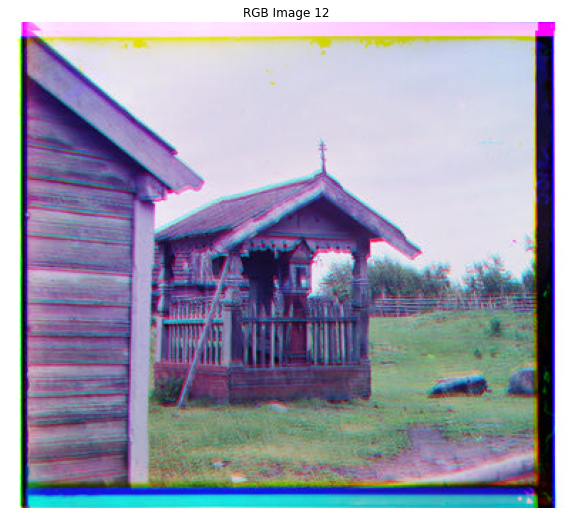

In [141]:
#Twelfth Image
image = cv2.imread(image_paths[11])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 12')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 398)
- G:  (341, 398)
- R:  (341, 398)
Align : [5, 3]
Best NCC :  0.12699052571073563
Align : [2, 2]
Best NCC :  0.21194156809802855


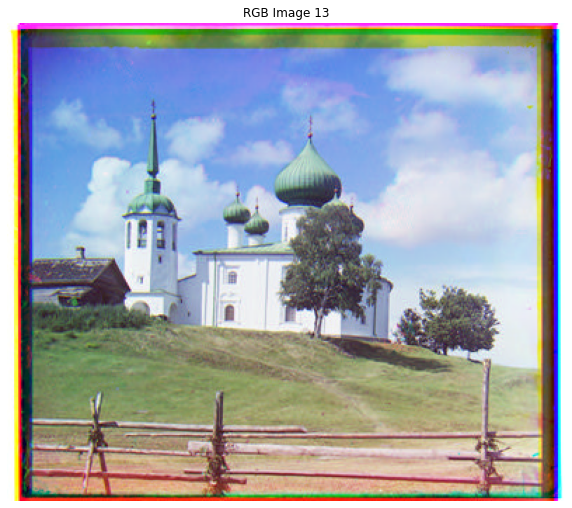

In [142]:
#Thirteenth Image
image = cv2.imread(image_paths[12])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 13')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (417, 480)
- G:  (417, 480)
- R:  (417, 480)
Align : [6, 0]
Best NCC :  0.18642790380548066
Align : [-3, -1]
Best NCC :  0.18523343310032794


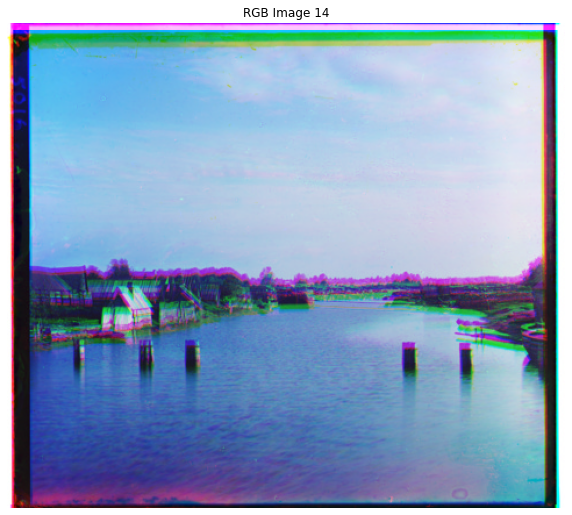

In [143]:
#Fourteenth Image
image = cv2.imread(image_paths[13])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 14')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 387)
- G:  (341, 387)
- R:  (341, 387)
Align : [5, -1]
Best NCC :  0.16299878961413813
Align : [0, -1]
Best NCC :  0.1793362165235495


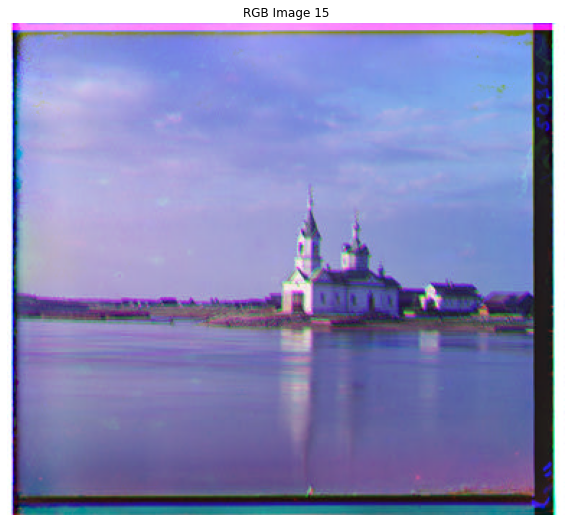

In [144]:
#Fifteenth Image
image = cv2.imread(image_paths[14])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 15')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 395)
- G:  (341, 395)
- R:  (341, 395)
Align : [7, -2]
Best NCC :  0.29871708325134383
Align : [2, -1]
Best NCC :  0.3077449280715871


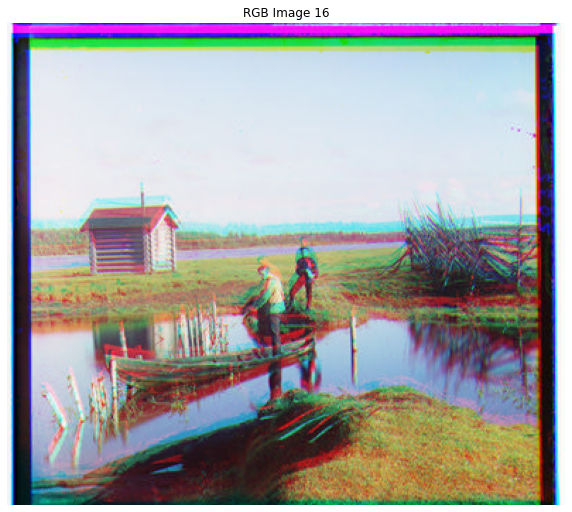

In [145]:
#Sixteenth Image
image = cv2.imread(image_paths[15])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 16')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (415, 480)
- G:  (415, 480)
- R:  (415, 480)
Align : [13, 3]
Best NCC :  0.16465149878417415
Align : [5, 2]
Best NCC :  0.1788005610496303


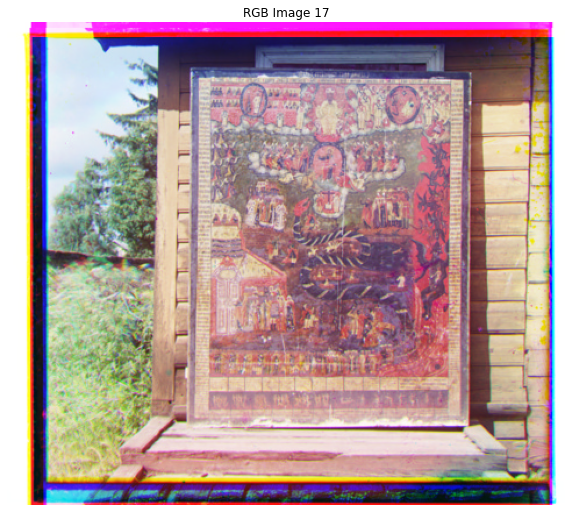

In [146]:
#Seventeenth Image
image = cv2.imread(image_paths[16])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 17')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 394)
- G:  (341, 394)
- R:  (341, 394)
Align : [4, 2]
Best NCC :  0.14409554186433643
Align : [1, 1]
Best NCC :  0.210888783566009


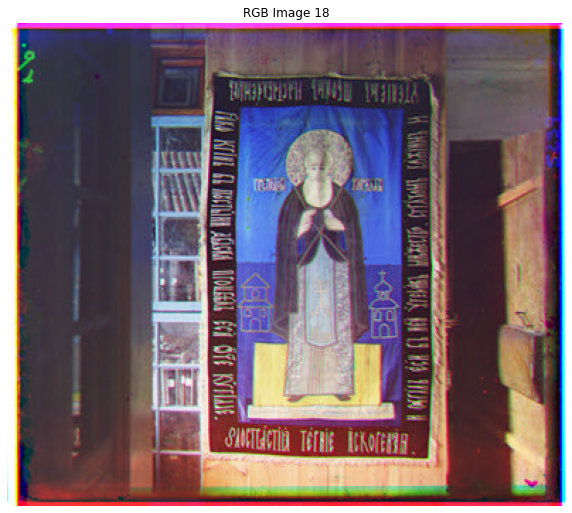

In [147]:
#Eighteenth Image
image = cv2.imread(image_paths[17])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 18')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (414, 480)
- G:  (414, 480)
- R:  (414, 480)
Align : [2, 2]
Best NCC :  0.17434926692113373
Align : [-2, 1]
Best NCC :  0.25646220918052565


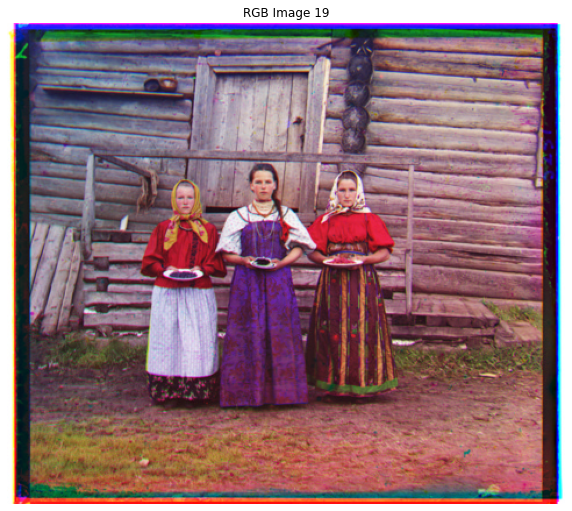

In [148]:
#Nineteenth Image
image = cv2.imread(image_paths[18])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 19')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (410, 480)
- G:  (410, 480)
- R:  (410, 480)
Align : [12, 7]
Best NCC :  0.2787874621619092
Align : [5, 4]
Best NCC :  0.23329353220562118


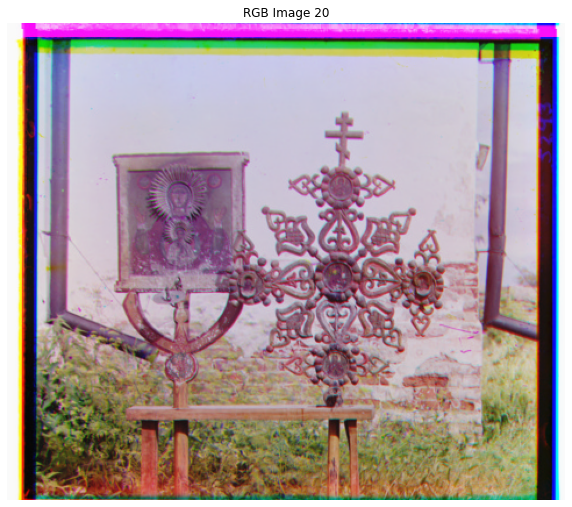

In [149]:
#Twentieth Image
image = cv2.imread(image_paths[19])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 20')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (408, 480)
- G:  (408, 480)
- R:  (408, 480)
Align : [11, 6]
Best NCC :  0.06892768347362453
Align : [1, 4]
Best NCC :  0.1739152462589981


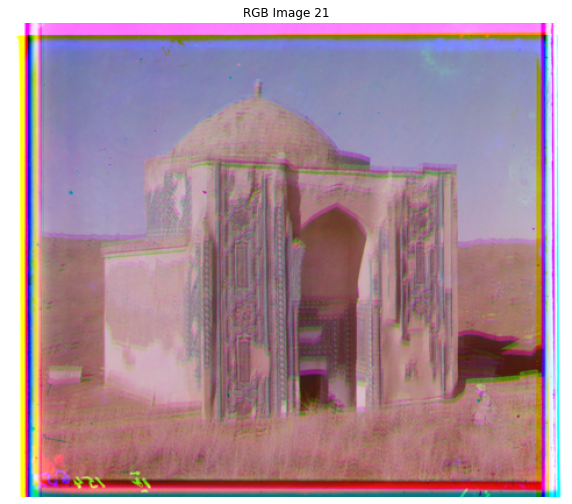

In [150]:
#Twenty First Image
image = cv2.imread(image_paths[20])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 21')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 396)
- G:  (341, 396)
- R:  (341, 396)
Align : [14, 4]
Best NCC :  0.2874239513997738
Align : [6, 2]
Best NCC :  0.2730829599131088


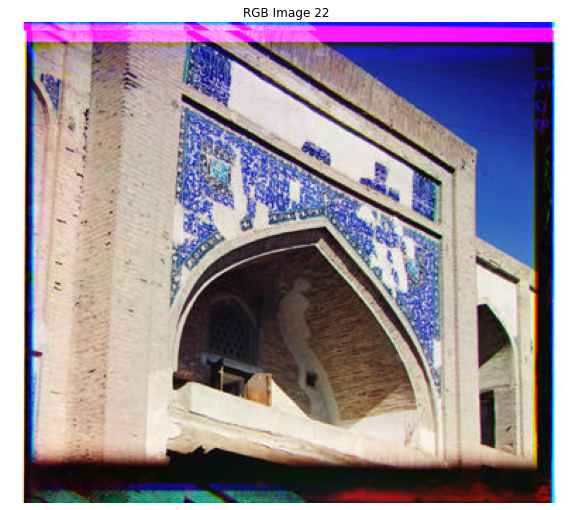

In [151]:
#Twenty Second Image
image = cv2.imread(image_paths[21])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 22')
plt.axis('off')
plt.show()


CROPPING RESULTS:
- B:  (341, 398)
- G:  (341, 398)
- R:  (341, 398)
Align : [10, 0]
Best NCC :  0.27566350992129407
Align : [9, 0]
Best NCC :  0.264287440859193


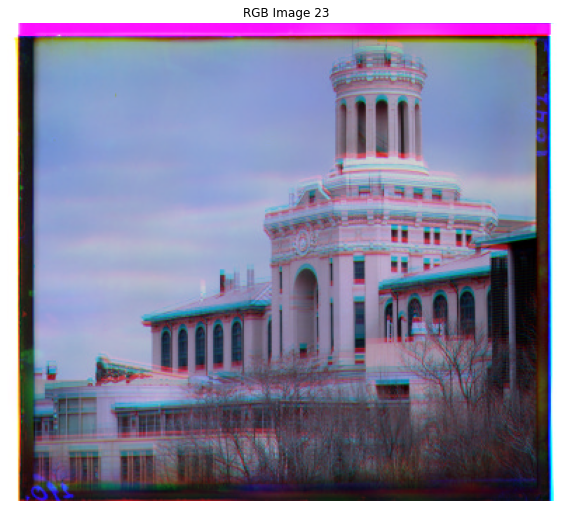

In [152]:
#Twenty Third Image
image = cv2.imread(image_paths[22])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blue, green, red = Image_Crop(gray)
final = Final_Image(blue,green,red,20)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(final,  cv2.COLOR_BGR2RGB))
plt.title('RGB Image 23')
plt.axis('off')
plt.show()